## Project Title: Wine Quality
**Description**: This project is being performed for the practice of data analysis and predictive modelling skills. The dataset involved is structured dataset containing information on wine quality and chemical attributes. Each row relates to one wine and the twelve columns show an average rating for the wine plus eleven different chemical attributes of the wine. The data is split into two CSV files with one for red wines and the other for white wines. The datasets are sourced from: http://archive.ics.uci.edu/ml/datasets/Wine+Quality.<br>
**Version**: 1.0<br>
**Author**: Tom Shaw Carveth<br>
**Create Date**: 29-Aug-2021<br>
**Input Data**: winequality-red.csv, winequality-white.csv

**Questions to explore**<br>
If we can view ratings for thousands of wines plus a category of red/white and almost a dozen chemical attributes of the wines, there are many interesting questions worth investigating. Some that we'll look into are:<br>
* What are the differences in the chemical attributes between red wine and white wine?
* Within each of the red/white categories, how do the chemical attributes differ between the high-rated wines and low-rated wines?
* With what precision can we identify the best quality wines? 
<br>

If we wanted to assume a business case, it will be - you're a wine merchant and supply the best hotels and restaurants in town. They expect high quality wines. Before making your wholesale purchasing decisions, you receive wine samples. You happen to have a contact who can test the chemical properties of the wine samples and this is ideal given you have chemical attribute data to build a predictive model for classifying wines on. You'll classify them as high quality or not high quality.

Opportunities for further work are to experiment with decision tree classification and XGBoost feature importance.

#### First, we'll import key libraries and functions

In [1]:
import pandas as pd, numpy as np, plotly.express as px, matplotlib.pyplot as plt
import importlib
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedStratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.metrics import roc_curve, plot_precision_recall_curve, average_precision_score
import custom_funcs as cf
# importlib.reload(cf)

#### Second, we'll read the CSV files and explore the data
The .info() method confirms what was stated at the data source of there being no missing values. Thankfully, the dataset is in a clean state.

In [2]:
df_red = pd.read_csv("winequality-red.csv", sep = ";")
df_white = pd.read_csv("winequality-white.csv", sep = ";")
# print(df_red.info())
# print(df_white.info())
# df_red.head(10)

### Examine the Quality rating variable and decide on a boundary for a high quality wine

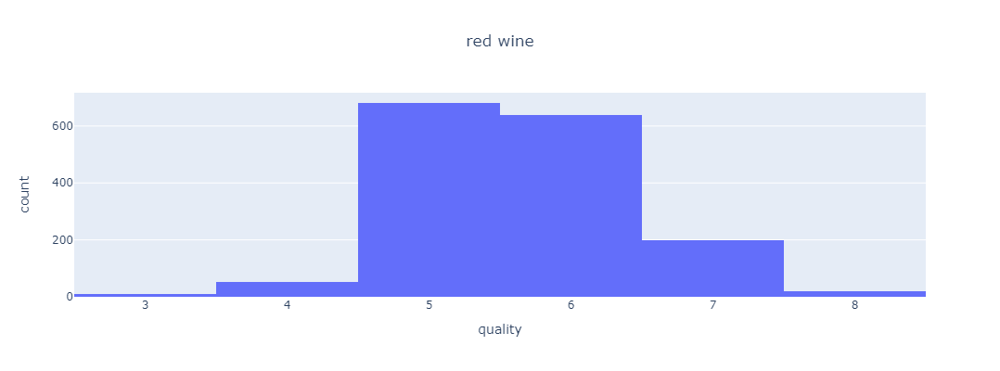

In [3]:
# to view using a percentage scale (a probability density diagram), use the argument: , histnorm='percent'
x = "density"
fig = px.histogram(df_red, "quality",width=600,height=400,title=f"red wine")
fig.update_layout(title_x=0.5)
fig.show();

The probability density histogram shows the red wine quality has the bulk of the scores split almost evenly on a rating of 5 and 6; both account for 83%. <br>
Quality rating 5 is the mode value with 43%. After these two ratings, the next greatest is 7 with 12%. 8 is very rare at 1.1%<br>
Ratings 1-2 and 9-10 are not given.<br>
It is not right to say this follows the Normal distribution.<br>

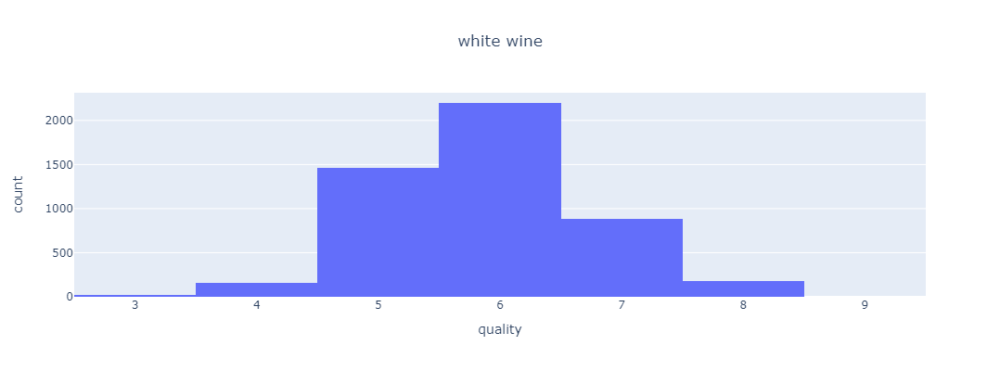

In [4]:
fig = px.histogram(df_white, "quality",width=600,height=400,title=f"white wine")
fig.update_layout(title_x=0.5)
fig.show()

The probability density histogram shows the white wine quality has the rating of 6 as having the greatest proportion of quality scores at 45%.<br>
The rating of 5 is at 30% and 7 is at 18%. 8 is very rare at 3.6%<br>
Ratings 1-2 and 10 are not given.<br>
This is closer to a Normal distribution than the red wine quality ratings but still not great.

As we want a reasonable amount of data to classify with and a rating of 7 is still very good, we'll set the boundary at greater than or equal to 7 for a high quality wine. This makes up 13.6% of red wines and 21.6% of white wines.<br>
It would be great to achieve a model which identifies the 8+ rated wines with good precision however there are far too few data points with such high ratings to train the model on.<br>

In [35]:
minimum_quality = 7
#### Creating a brief custom function for assigning the class
def assign_class(score):
    """
    README
    The function returns a class of 'high quality' or 'low quality' based on the input's value relative to the global variable minimum_quality
    score (INT) - minimum quality
    """
    if score >= minimum_quality:
        return 'high quality'
    else:
        return 'not high quality'

### Description of chemical attributes:
1 - **fixed acidity:** most acids involved with wine or fixed or nonvolatile (do not evaporate readily)<br>
2 - **volatile acidity:** the amount of acetic acid in wine, which at too high of levels can lead to an unpleasant, vinegar taste<br>
3 - **citric acid:** found in small quantities, citric acid can add ‘freshness’ and flavor to wines<br>
4 - **residual sugar:** the amount of sugar remaining after fermentation stops, it’s rare to find wines with less than 1 gram/litre and wines with greater than 45 grams/liter are considered sweet<br>
5 - **chlorides:** the amount of salt in the wine<br>
6 - **free sulfur dioxide:** the free form of SO2 exists in equilibrium between molecular SO2 (as a dissolved gas) and bisulfite ion; it prevents microbial growth and the oxidation of wine<br>
7 - **total sulfur dioxide:** amount of free and bound forms of S02; in low concentrations, SO2 is mostly undetectable in wine, but at free SO2 concentrations over 50 ppm, SO2 becomes evident in the nose and taste of wine. High concentrations tend to mask the original, fruity aromas of the wine.<br>
8 - **density:** the density of water is close to that of water depending on the percent alcohol and sugar content<br>
9 - **pH:** describes how acidic or basic a wine is on a scale from 0 (very acidic) to 14 (very basic); most wines are between 3-4 on the pH scale<br>
10 - **sulphates:** a wine additive which can contribute to sulfur dioxide gas (S02) levels and acts as an antimicrobial and antioxidant. Sulphates act as both a wine’s preservative and enhancer. Many vintners purposely add sulphates at key moments of the winemaking process to quickly halt ongoing fermentation or to help protect the wine against potential oxidation or bacterial exposure which could occur at various stages of the winemaking process.<br>
11 - **alcohol:** the percent alcohol content of the wine

In [6]:
df_red.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [7]:
df_white.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


**These huge tables of statistics can be overwhelming for some. Box plots and histograms are brilliant graphical exploratory analysis tools so will be used next.**<br>
Plotly has great interactive plots including box-plots and histograms.

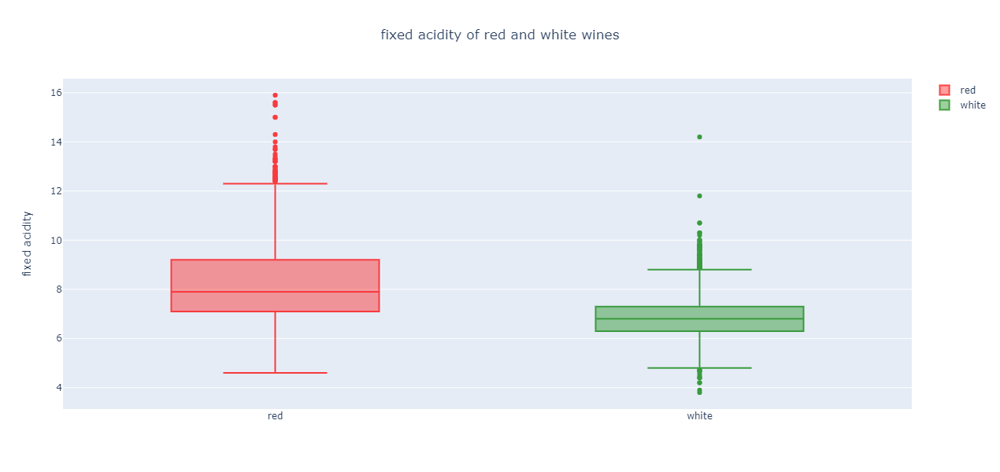

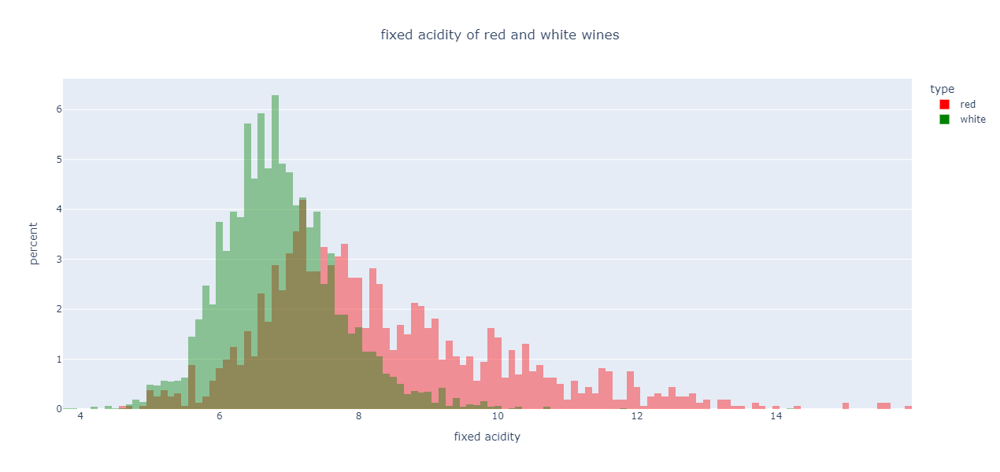

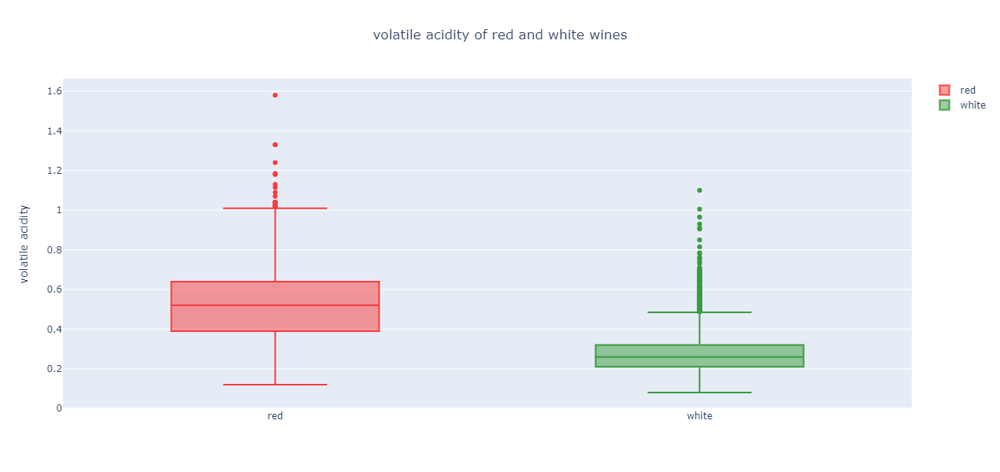

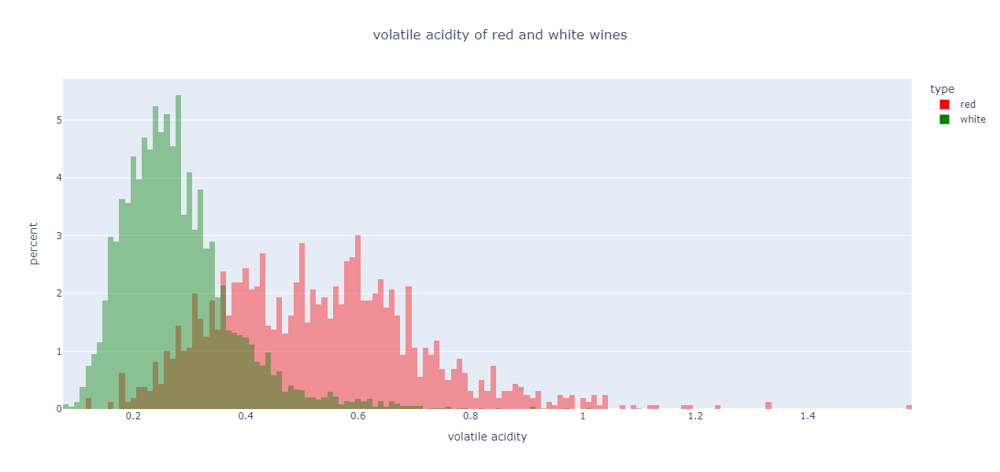

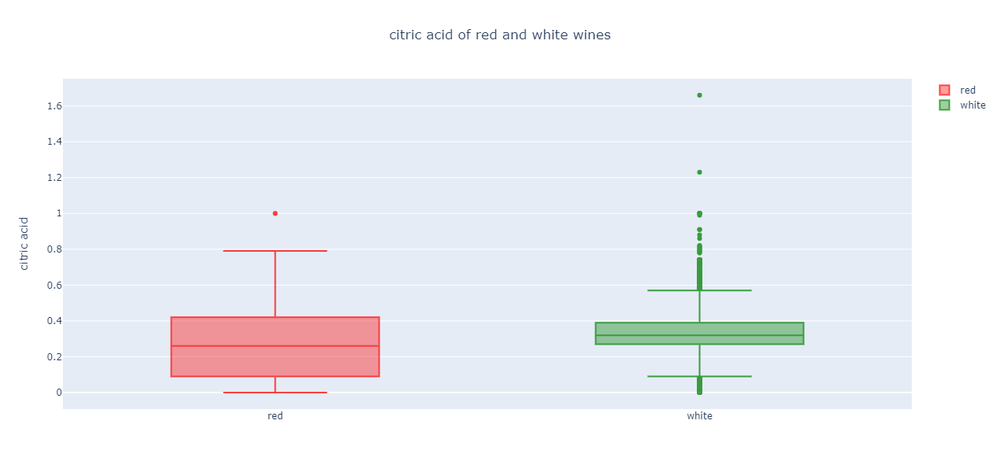

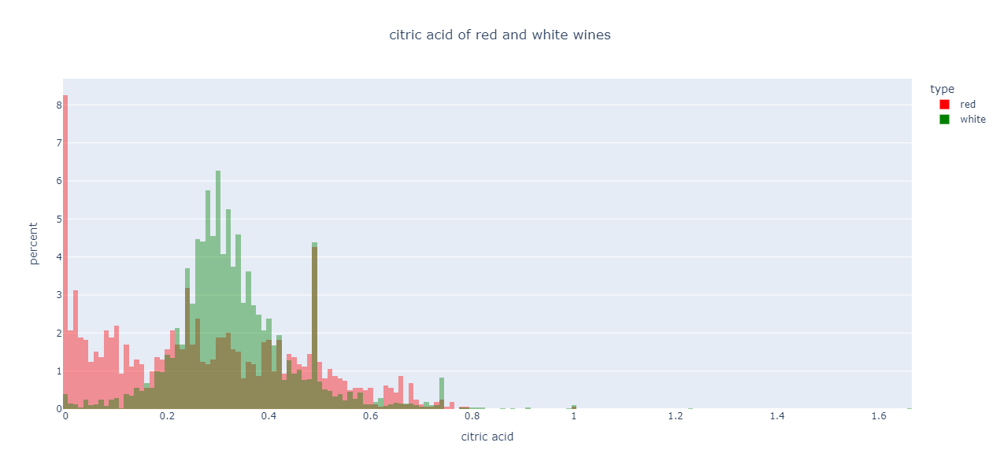

In [14]:
df_red_concat = df_red.copy()
df_red_concat['type'] = 'red'
df_white_concat = df_white.copy()
df_white_concat['type'] = 'white'
df_wines = pd.concat([df_red_concat,df_white_concat]).reset_index(drop=True)
cf.box_plots_hist(df_wines, 'type', cols=[i for i in df_wines.columns if i not in ['type']], title_box=' of red and white wines', title_hist=' of red and white wines')

### Findings
One thing is very clear: red wine and white wine differ a great deal in their chemical properties as well as their colour. Alcohol is one attribute they have similar distributions on.<br>
**Fixed acidity** – red wine has greater fixed acidity in terms of its mean and median. It has a larger interquartile range and variance than white wine. Its values are more widely dispersed. Both have quite a lot of high outliers with the red wine outliers being higher.<br>
**Volatile acidity** – red wine has greater volatile acidity in terms of its mean and median. It has a larger interquartile range and variance than white wine. Its values are more widely dispersed. Both have many high outliers but no low outliers. The high outliers of the white wine don’t surpass the red wine maximum.<br>
**Citric acid** – red wine has slightly lower median and mean. It has a larger interquartile range and variance. Its values are quite broadly dispersed and it does not have many outliers; only one. White wine has a narrow interquartile range and many low-value and high-value outliers. The histograms here stand out as very unique because the white wine has a shape similar to a Gaussian distribution whereas the red wine is far from it. <br>
**Residual sugar** – red wine has very low residual sugar. Its mean and median are far lower than white wine. Its interquartile range is also far narrower. It does have some high value outliers but they are not particularly high in comparison to the values seen with the white wine. White wine has far more widely dispersed residual sugar values. It also has a small number of high value outliers including one with an unusually high value. This time the histogram has red wine with a somewhat Gaussian distribution while white wine is far from it. <br>
**Chlorides** – Both the red wine and white wines have very narrow interquartile ranges relative to their range. Red wines have a slightly larger mean, median, interquartile range and variance. Both have a lot of high-value outliers and a few low-value outliers. The largest outliers found with the red wine are far above those found with the white wine. The distributions seen in the histograms show that red and white have a similar shape but with red shifted to the right with higher levels of chlorides and with greater numbers of outliers. <br>
**Free sulphur dioxide** – red wine has a smaller mean, median and interquartile range. It has some high-value outliers but they are small in comparison to the many high-value outliers seen with the white wine. White wine has one unusually high outlier. The histogram shows that the white wine is close to a Gaussian distribution but has a lot of outliers whereas the red wine is not close. <br>
**Total sulphur dioxide** – red wine has a far smaller median and mean. Its interquartile range is slightly smaller. It has far smaller variance. Red wine has some high outliers but white wine has far higher outliers. The histogram shows a similar distribution as was seen with free sulphur dioxide measurements. <br>
**Density** – red wine has a larger mean and median than white wine. It also has a far narrower interquartile range than white wine and smaller variance. Red wine has a lot of outliers. White wine has very few outliers. One of them is unusually large and goes further than the maximum of the red wine. The histogram shows that the red wine density distribution has a very sharp shape similar to a Gaussian distribution. <br>
**pH** – Red wine has a larger median and mean than white. They have similar-sized interquartile ranges and variances. White wine appears to have larger numbers of outliers. The distributions seen in the histogram appear very similar but with red wine being shifted to the right. <br>
**Sulphates** – Red wine has a slightly larger median and mean. It has a larger interquartile range and far higher outliers. The distribution seen in the histogram is similar to a Gaussian distribution. <br>
**Alcohol** – White wine and red wine have very close distributions. Still, white wine has a very slightly higher median, mean, interquartile range and variation. The minimum alcohol level found with the white wines is lower than the minimum with red wines. The red wine has a few high outliers which go above the maximum found in the white wine. White wine has no outliers. <br>


### Red wines: Add quality class column and examine differences in the chemical attributes

In [16]:
s_red_hq = (df_red['quality'] >= minimum_quality).rename('high quality') #### create a boolean series
df_red_class = df_red['quality'].apply(lambda x: assign_class(x)).rename('class')
df_red_hq = pd.concat([df_red,s_red_hq*1,df_red_class],axis=1) #### convert boolean to binary
red_count = len(df_red)
red_hq_count = len(df_red_hq.loc[df_red_hq['high quality']==1])
print(f'There are {red_count} red wines of which {red_hq_count} are rated high quality. This creates a {np.round(red_hq_count/red_count,3)} probability of selecting one at random')

There are 1599 red wines of which 217 are rated high quality. This creates a 0.136 probability of selecting one at random


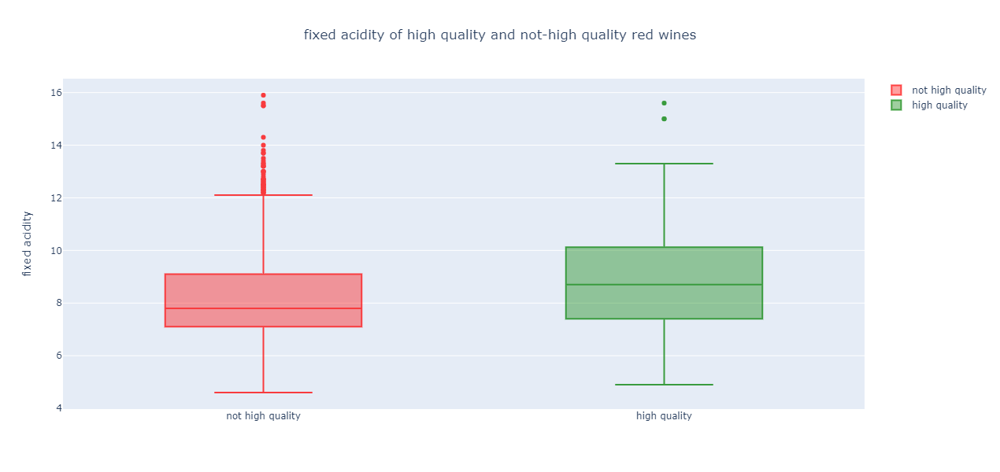

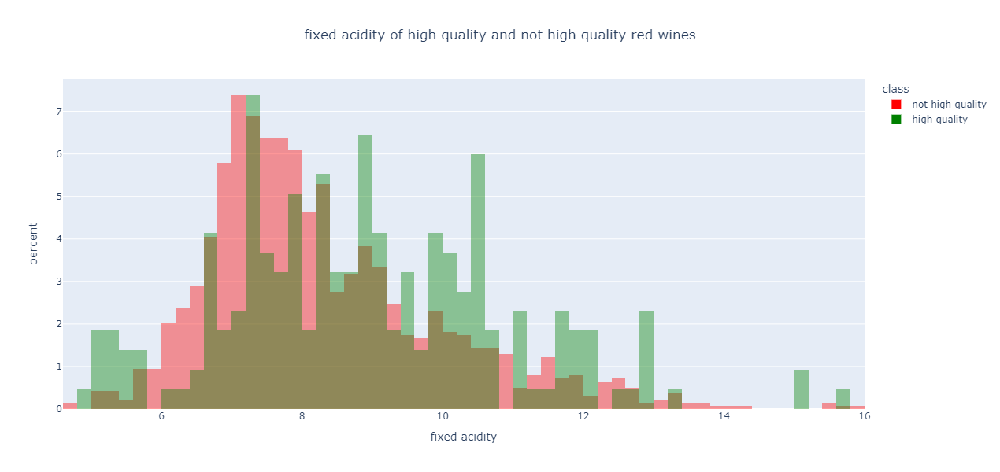

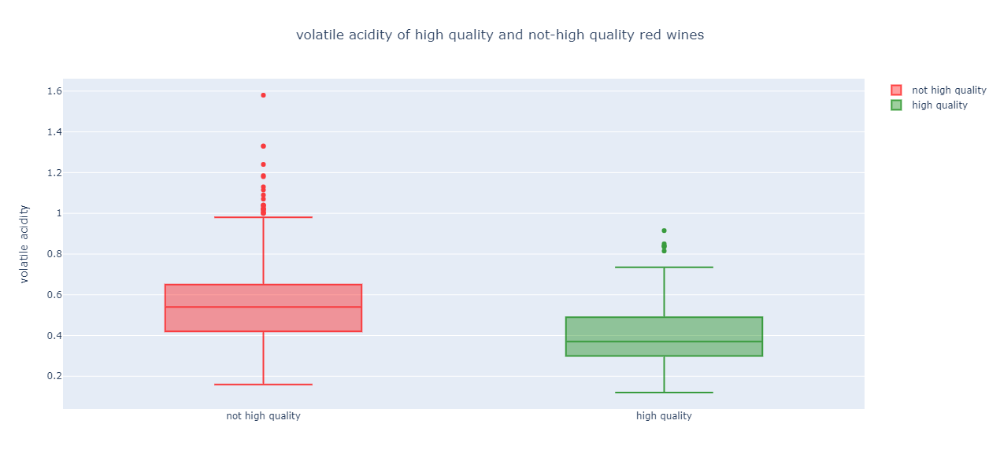

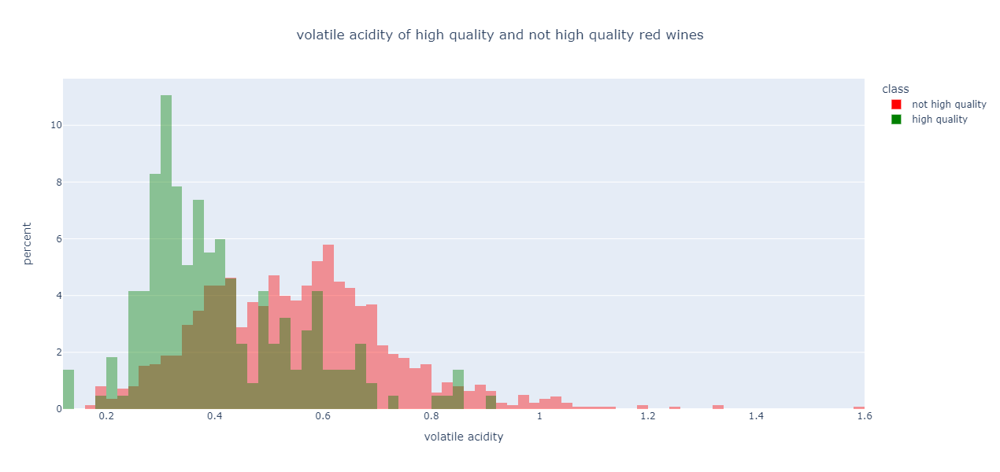

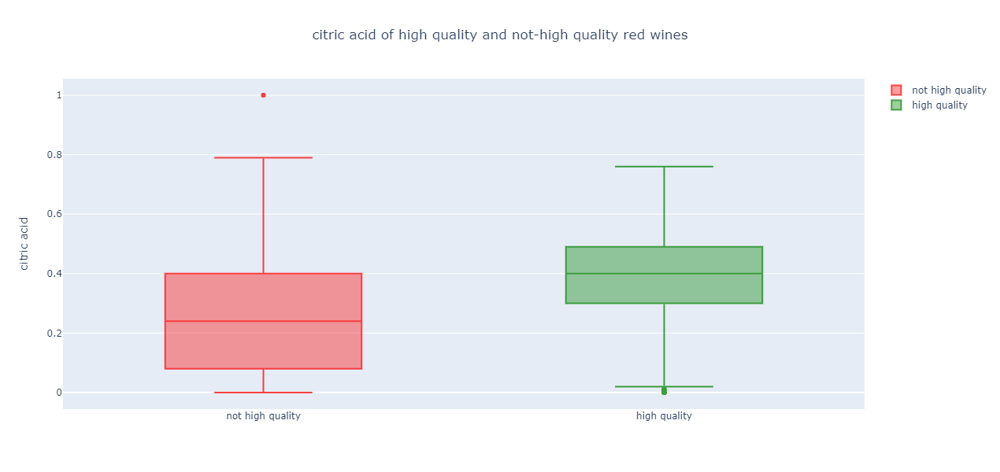

...

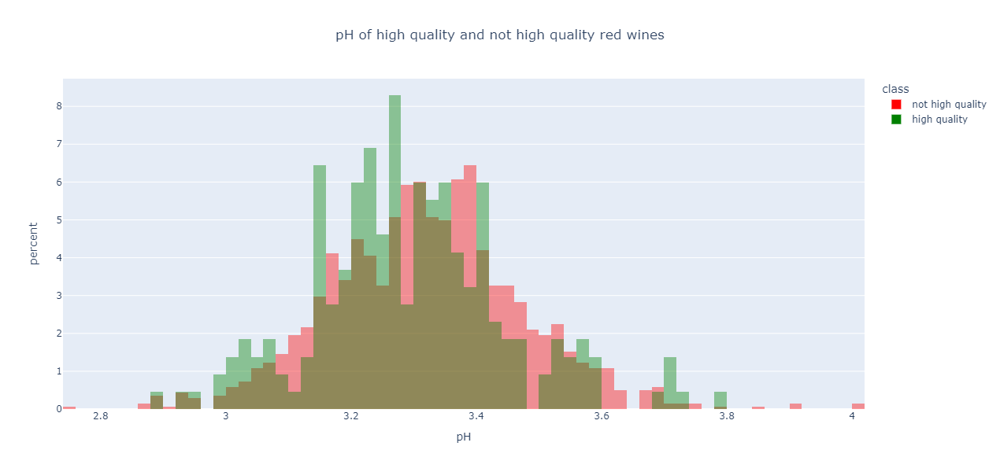

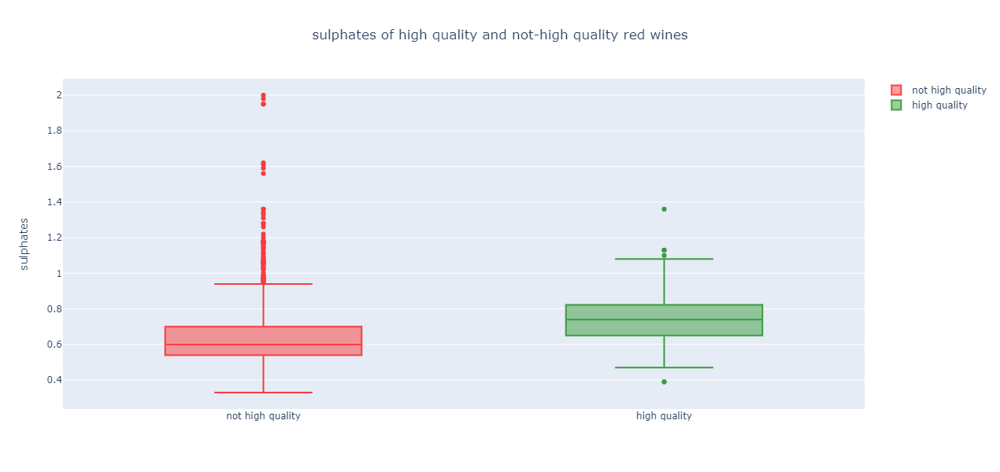

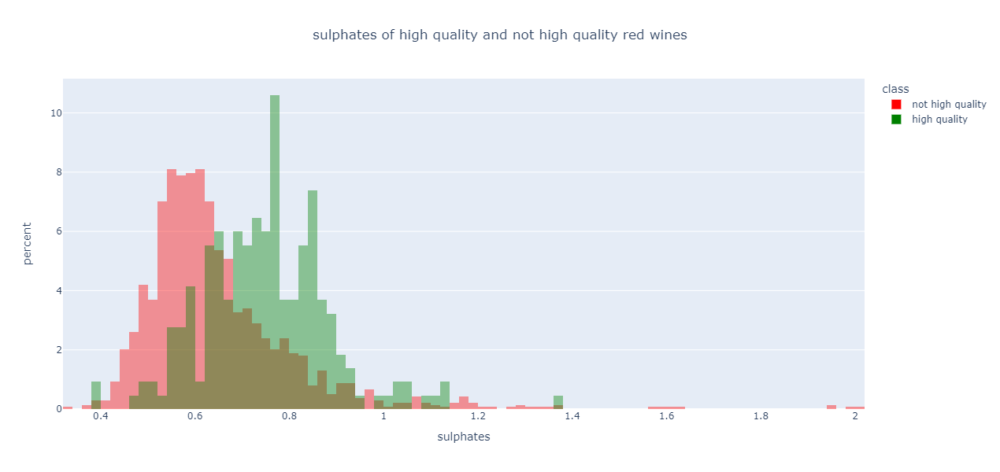

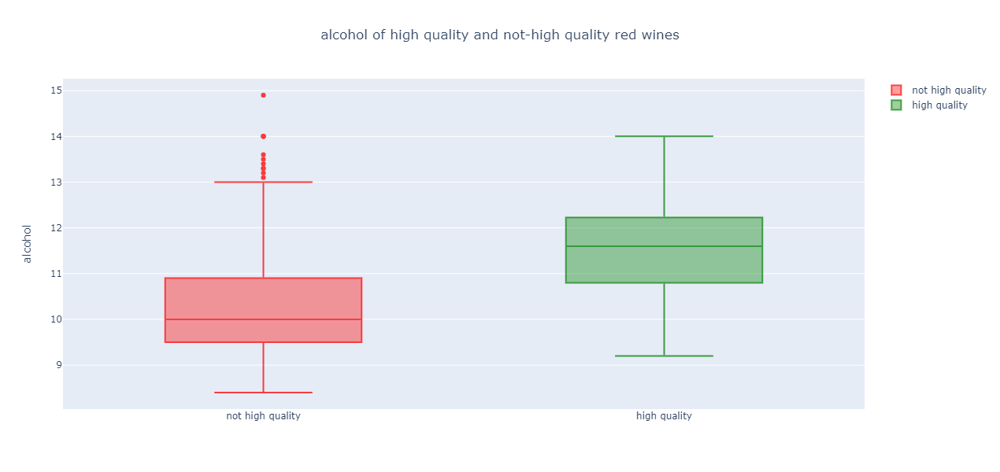

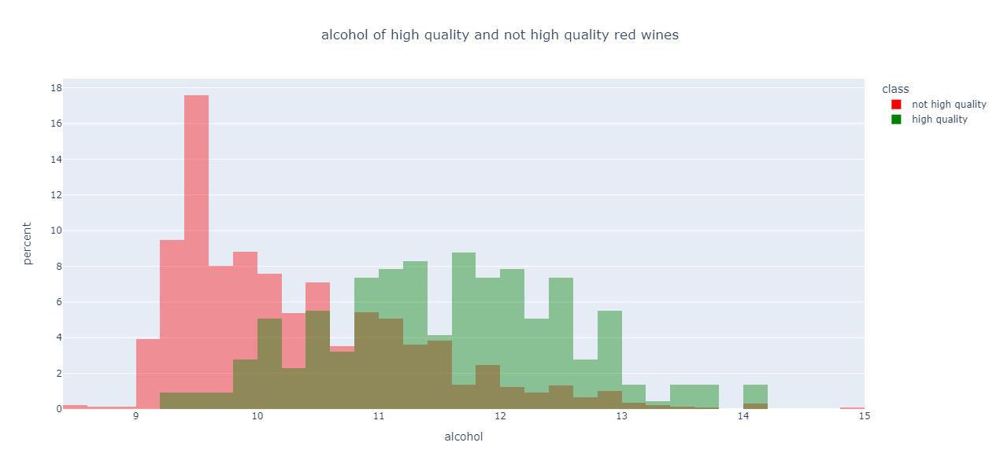

In [17]:
cf.box_plots_hist(df_red_hq, 'class', cols=[i for i in df_red_hq.columns if i not in ['high quality','quality','class']], title_box=' of high quality and not-high quality red wines', title_hist=' of high quality and not high quality red wines')

**Some noticeable patterns with red wines include that high quality red wines (relative to not high quality red wine):**<br>
* higher and more dispersed distribution of fixed acidity
* lower distribution of volatile acidity
* higher distribution of citric acid
* similar distribution with residual sugar but fewer extreme values.
* lower distribution of chlorides
* slightly lower distribution of free sulphur dioxide
* lower and more concentrated distribution of total sulphur dioxide. Most of them are near or below 50mg. There are a few odd outliers with extreme values.
* lower distribution of density but a bit more dispersed
* pH distribution not much different
* higher distribution of sulphates
* far higher distribution of alcohol levels

### Red wine: Feature importance and selection using recursive feature elimination with cross-validation
The f1 score and precision are important scoring metrics of interest because the positive outcomes (high quality) are most important to us and the distribution of the two outcomes is fairly imbalanced toward not high quality.<br>

In [9]:
scoring = 'f1' #### options include: precision, f1, accuracy, roc_auc

In [18]:
#### Hold out some data to be kept unseen for model testing
X = df_red_hq[[i for i in df_red_hq.columns if i not in ['high quality','class']]] #### the 'quality' field is left in for later review
y = df_red_hq['high quality']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.25, random_state=42)

Optimal number of features : 10


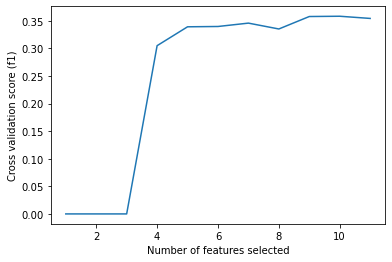

,rank,attribute
0,1,fixed acidity
1,1,volatile acidity
2,1,citric acid
3,1,residual sugar
4,1,chlorides
6,1,total sulfur dioxide
7,1,density
8,1,pH
9,1,sulphates
10,1,alcohol


In [20]:
# Select X and y data from wine dataframe
X = X_train[[i for i in X_train.columns if i not in ['quality']]]
y = y_train

# Create the RFE object and compute a cross-validated score.
model = LogisticRegression(max_iter=2000)

min_features_to_select = 1  # Minimum number of features to consider
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

rfecv = RFECV(estimator=model, step=1, cv=cv,
              scoring=scoring,
              min_features_to_select=min_features_to_select)
rfecv.fit(X, y)
print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel(f"Cross validation score ({scoring})")
plt.plot(range(min_features_to_select,
               len(rfecv.grid_scores_) + min_features_to_select),
         rfecv.grid_scores_)
plt.show()

attributes = [i for i in X_train.columns if i not in(['quality','high quality','class'])]
top_attributes = [i for (i, v) in zip(attributes, list(rfecv.support_)) if v]
df_ranked_attributes = pd.DataFrame({'rank':rfecv.ranking_,'attribute':attributes})
df_ranked_attributes.sort_values('rank').head(20)

### Red wine: Set and tune the hyperparameters to fit the best model
The hyperparameters which will have multiple values tested are the solver algorithm and the C value.

In [21]:
print(len(top_attributes), 'x-variables used')

model = LogisticRegression(max_iter=2000)
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_space = np.logspace(-5, 8, 15)

#### define grid search and fit
grid = dict(solver=solvers,penalty=penalty,C=c_space)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=scoring, error_score=0)
grid_result = grid_search.fit(X_train[top_attributes], y_train)

#### summarize results
print("Best score: %f achieved using %s" % (grid_result.best_score_, grid_result.best_params_))

#### un-comment this if want to see results of all hyperparameter combinations
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

10 x-variables used
Best score: 0.428572 achieved using {'C': 31.622776601683793, 'penalty': 'l2', 'solver': 'lbfgs'}


#### Findings
using the 10 recommended X-variables and a quality definition of 7+, the best f1 score is 0.4286. <br>C parameter of 31.62. Penalty 'l2'. Solver 'lbfgs'<br>

### Red wine: Look at the performance on the held-out test data

#### View a confusion matrix

precision score is 0.7037
recall score is 0.3519
f1 score is 0.4691
accuracy score is 0.8925


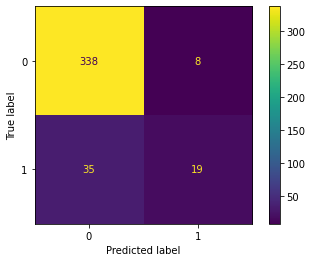

In [22]:
from sklearn.metrics import plot_confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
y_pred = grid_result.predict(X_test[top_attributes])
print('precision score is',np.round(precision_score(y_test, y_pred),4))
print('recall score is',np.round(recall_score(y_test, y_pred),4))
print('f1 score is',np.round(f1_score(y_test, y_pred),4))
print('accuracy score is',np.round(accuracy_score(y_test, y_pred),4))
plot_confusion_matrix(grid_result, X_test[top_attributes], y_test)
plt.show();

#### View Precision-Recall Plot

Average precision-recall score: 0.54


Text(0.5, 1.0, '2-class Precision-Recall curve: AP=0.54')

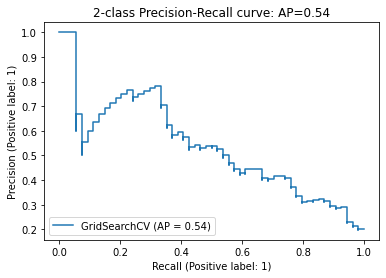

In [23]:
y_score = grid_result.decision_function(X_test[top_attributes])
average_precision = average_precision_score(y_test, y_score)
print('Average precision-recall score: {0:0.2f}'.format(average_precision))

disp = plot_precision_recall_curve(grid_result, X_test[top_attributes], y_test)
disp.ax_.set_title('2-class Precision-Recall curve: '
                   'AP={0:0.2f}'.format(average_precision))

#### View ROC curve

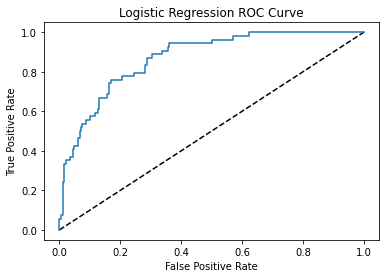

In [24]:
y_pred_prob = grid_result.predict_proba(X_test[top_attributes])
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob[:,1])
plt.plot([0,1], [0,1], 'k--')
plt.plot(fpr, tpr, label ='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve')
plt.show();

#### View raw data, predicted values, predicted probabilities
All those predicted as 'High Quality' which the model missclassified still are of the quality rating of 6 which is not overly concerning. If we were recommending wines and the errors were only one rung down at a 6-rated wine then it is not overly concerning of a reputation risk. It is good to see it doesn't missclassify the 3 or 4 rated wines as high quality.

In [25]:
series_preds = pd.Series(data=y_pred, name='pred')
series_probs = pd.Series(data=y_pred_prob[:,1], name='pred_prob')
custom_prob = 0.6
series_preds_custom = (series_probs > custom_prob).rename(f'pred_{custom_prob}')
# print(series_preds_custom)
df_test_prob = pd.concat([X_test.reset_index(),series_preds,series_probs,series_preds_custom],axis=1)
df_test_prob.sort_values('pred_prob',ascending=False).iloc[:,:].head(50)
df_test_prob.groupby('quality').agg({'pred':['count','sum'],f'pred_{custom_prob}':['sum']}).rename(columns={'sum':'predicted HQ'}).sort_values('quality',ascending=False).head(10)

pred                  pred_0.6
        count predicted HQ predicted HQ
quality                                
8           8            5            5
7          46           14            7
6         149            8            4
5         179            0            0
4          14            0            0
3           4            0            0

### White wines: Add quality class column and examine differences in the chemical attributes

In [26]:
s_white_hq = (df_white['quality'] >= minimum_quality).rename('high quality') #### create a boolean series
df_white_class = df_white['quality'].apply(lambda x: assign_class(x)).rename('class')
df_white_hq = pd.concat([df_white,s_white_hq*1,df_white_class],axis=1) #### convert boolean to binary
white_count = len(df_white)
white_hq_count = len(df_white_hq.loc[df_white_hq['high quality']==1])
print(f'There are {white_count} white wines of which {white_hq_count} are rated High Quality. This creates a {np.round(white_hq_count/white_count,3)} probability of selecting one at random')

There are 4898 white wines of which 1060 are rated High Quality. This creates a 0.216 probability of selecting one at random


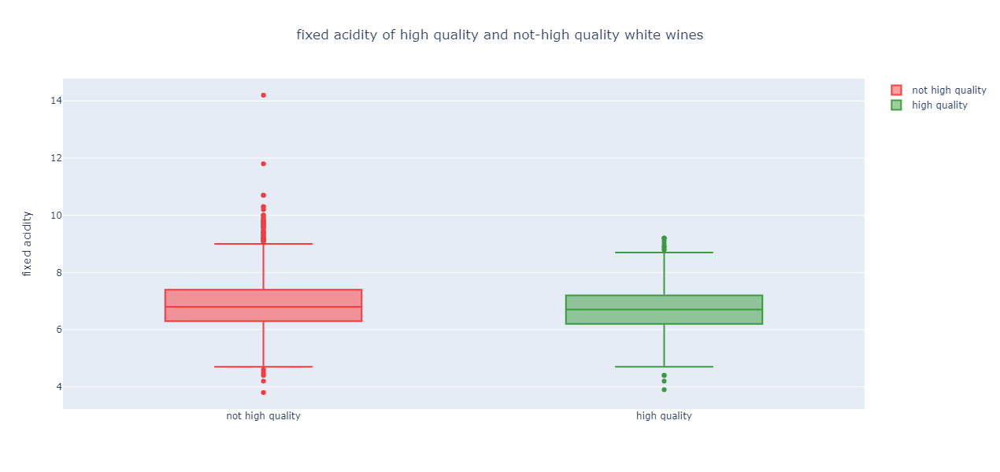

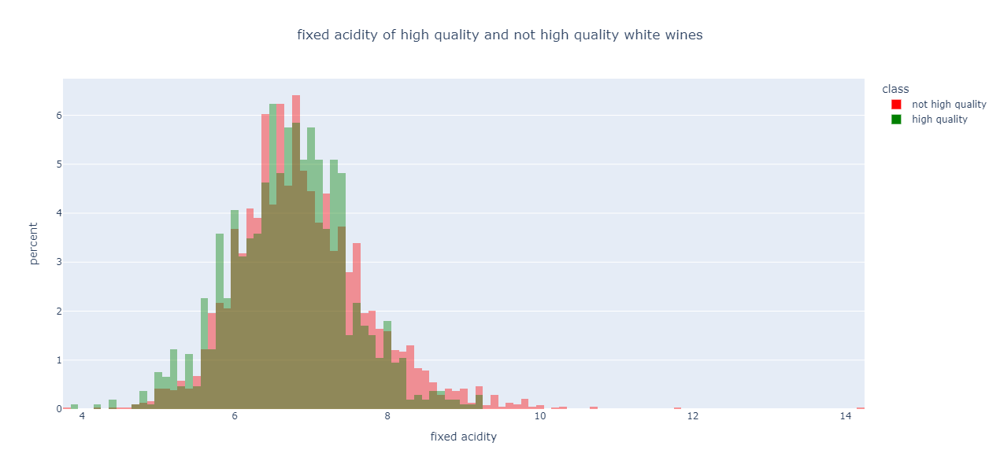

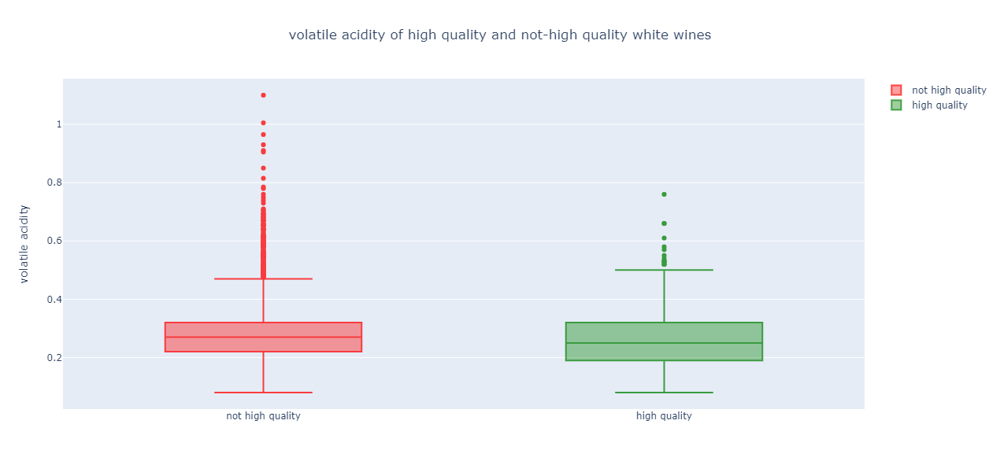

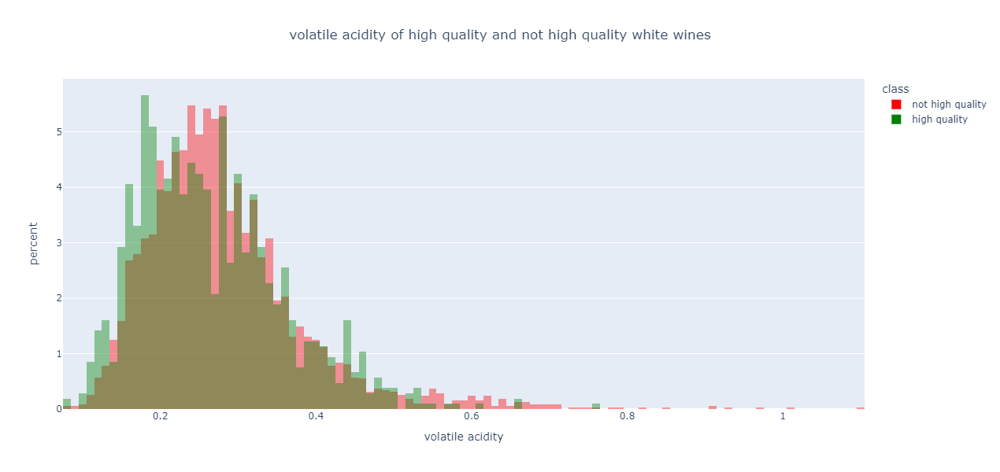

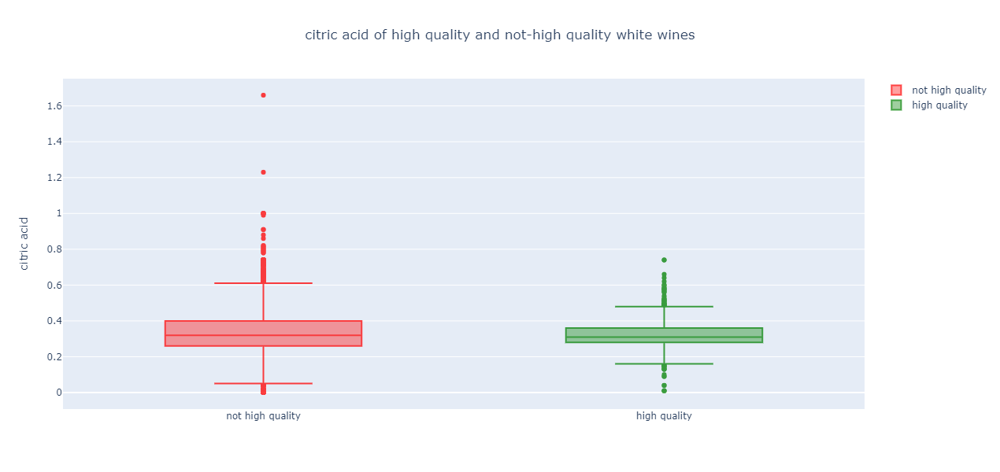

...

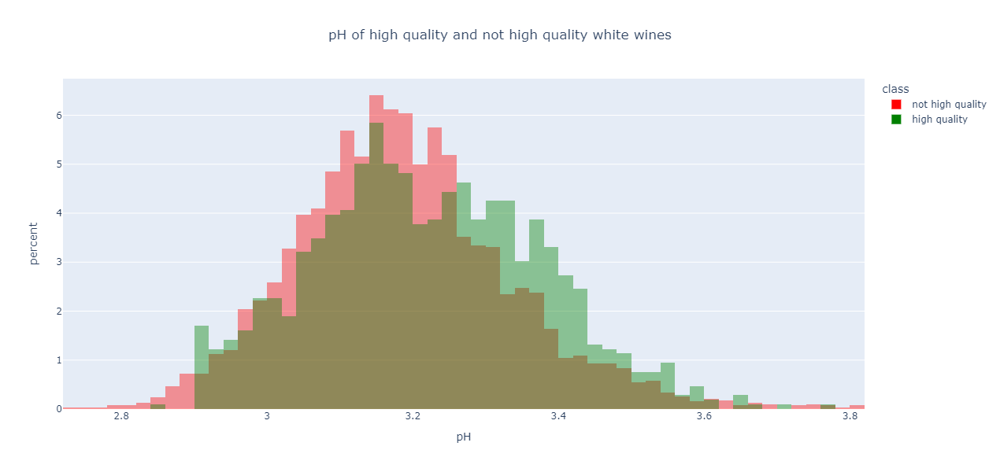

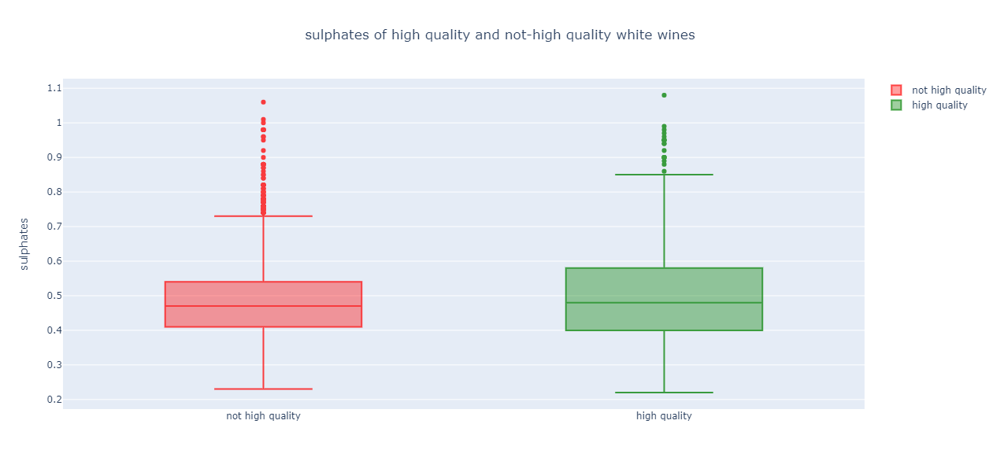

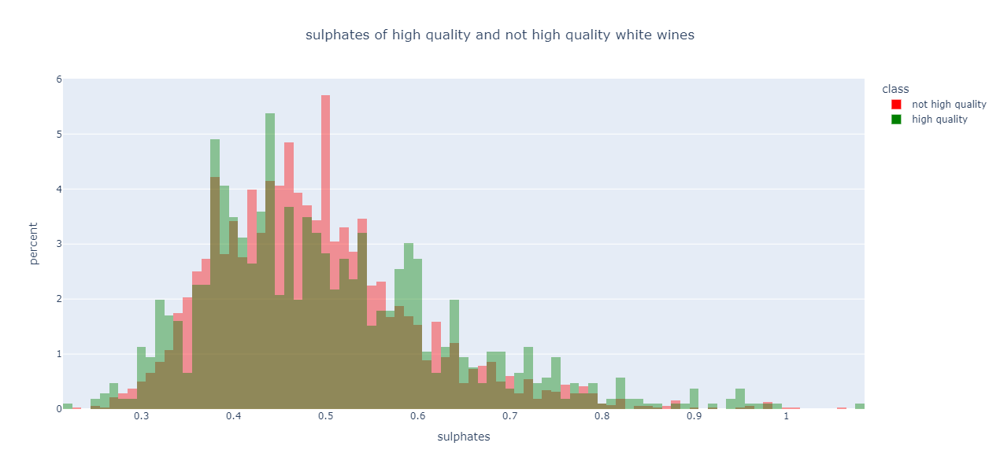

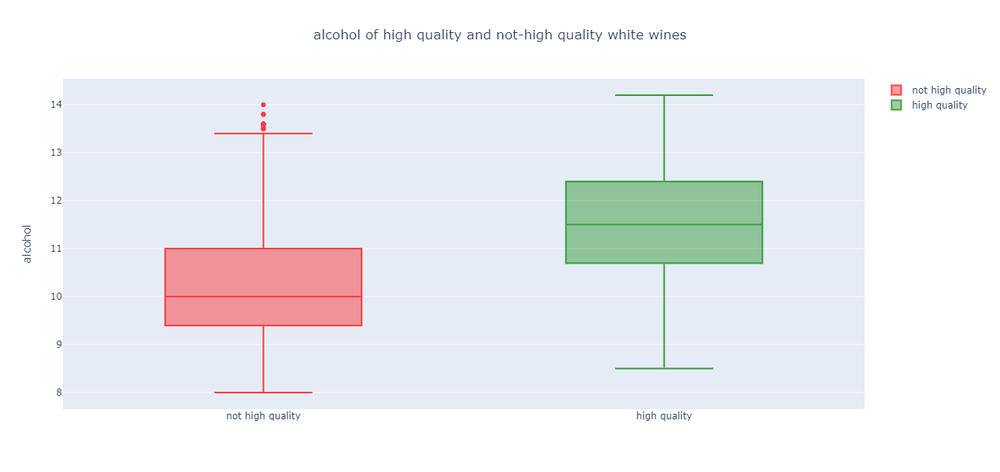

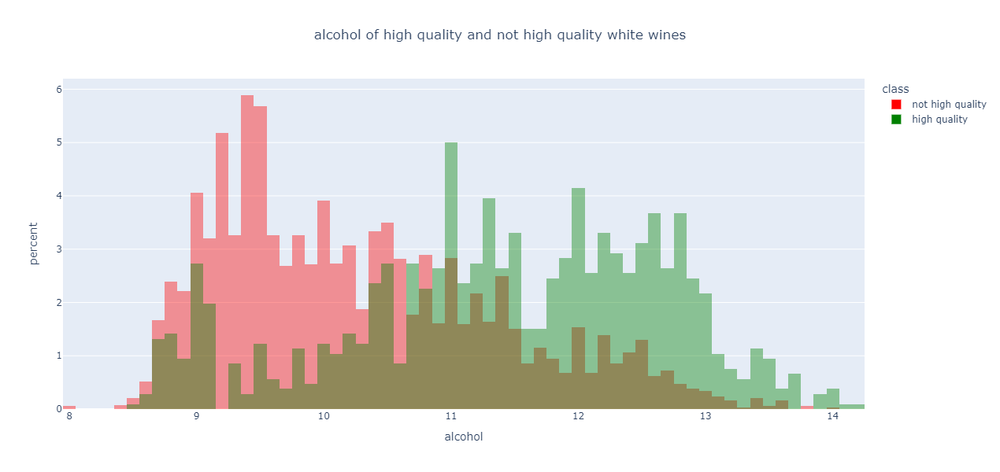

In [27]:
cf.box_plots_hist(df_white_hq, 'class', cols=[i for i in df_white_hq.columns if i not in ['high quality','quality','class']], title_box=' of high quality and not-high quality white wines', title_hist=' of high quality and not high quality white wines')

**Some noticeable patterns with white wines include that high quality white wines (relative to not high quality white wine):**<br>
* higher and more dispersed distribution of fixed acidity
* lower distribution of volatile acidity
* higher distribution of citric acid
* lower distribution with residual sugar but far fewer extreme values.
* lower distribution of chlorides
* slightly lower distribution of free sulphur dioxide
* lower and more concentrated distribution of total sulphur dioxide. Most of them are near or below 50mg. There are a few odd outliers with extreme values.
* lower distribution of density, with a smaller variance centered on 0.990-0.992. The not high quality white wines have greater variance; centered around 0.990-0.999.
* pH distribution not much different
* higher distribution of sulphates
* higher distribution of alcohol levels. A scattered distribution with one small pocket around 8.6 to 9.1%%, and two large pockets near 10.6-11.5% and 11.8-13%.<br>
Citric acid, residual sugar, chlorides, density and alcohol appear to differ most.

### White wine: Feature importance and selection using recursive feature elimination with cross-validation
The f1 score is a scoring metric of interest because the positive y-values (high quality) are of most importance and the distribution of the two is fairly imbalanced toward not high quality.<br>

In [153]:
scoring = 'f1' #### options include: precision, f1, accuracy, roc_auc

In [29]:
#### Hold out some data to be kept unseen for model testing
X = df_white_hq[[i for i in df_white_hq.columns if i not in ['high quality','class']]] #### the 'quality' field is left in for later review
y = df_white_hq['high quality']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size = 0.25, random_state=42)

Optimal number of features : 11


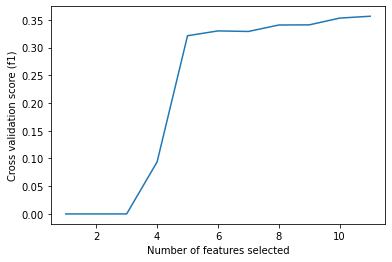

,rank,attribute
0,1,fixed acidity
1,1,volatile acidity
2,1,citric acid
3,1,residual sugar
4,1,chlorides
5,1,free sulfur dioxide
6,1,total sulfur dioxide
7,1,density
8,1,pH
9,1,sulphates


In [30]:
# Select X and y data from wine dataframe
X = X_train[[i for i in X_train.columns if i not in ['quality']]]
y = y_train

# Create the RFE object and compute a cross-validated score.
model = LogisticRegression(max_iter=2000)

min_features_to_select = 1  # Minimum number of features to consider
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

rfecv = RFECV(estimator=model, step=1, cv=cv,
              scoring=scoring,
              min_features_to_select=min_features_to_select)
rfecv.fit(X, y)
print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel(f"Cross validation score ({scoring})")
plt.plot(range(min_features_to_select,
               len(rfecv.grid_scores_) + min_features_to_select),
         rfecv.grid_scores_)
plt.show()

attributes = [i for i in X_train.columns if i not in(['quality','high quality','class'])]
top_attributes = [i for (i, v) in zip(attributes, list(rfecv.support_)) if v]
df_ranked_attributes = pd.DataFrame({'rank':rfecv.ranking_,'attribute':attributes})
df_ranked_attributes.sort_values('rank').head(20)

### White wine: Set and tune the hyperparameters to fit the best model
The hyperparameters which will have multiple values tested are the solver algorithm and the C value.

In [31]:
print(len(top_attributes), 'x-variables used')

model = LogisticRegression(max_iter=2000)
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_space = np.logspace(-5, 8, 15)

#### define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_space)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=scoring, error_score=0)
grid_result = grid_search.fit(X_train[top_attributes], y_train)

#### summarize results
print("Best score: %f achieved using %s" % (grid_result.best_score_, grid_result.best_params_))
#### un-comment this if want to see results of all hyperparameter combinations
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

11 x-variables used
Best score: 0.367267 achieved using {'C': 1389495.494373136, 'penalty': 'l2', 'solver': 'newton-cg'}


C:\Users\Thomas\Anaconda3\Lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning:

The line search algorithm did not converge

C:\Users\Thomas\Anaconda3\Lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



#### Findings
using the 11 recommended X-variables and a quality definition of 7+, the best f1 score is 0.3673.<br>
 C parameter of 1389495.49. Penalty 'l2'. Solver 'newton-cg'<br>

### White wine: Look at the performance on the held-out test data

#### View a confusion matrix

precision score is 0.6016
recall score is 0.2792
f1 score is 0.3814
accuracy score is 0.8041


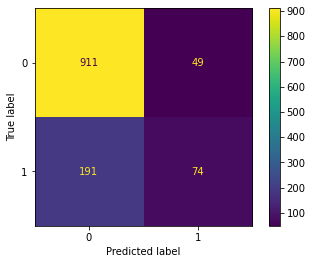

In [157]:
from sklearn.metrics import plot_confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
y_pred = grid_result.predict(X_test[top_attributes])
print('precision score is',np.round(precision_score(y_test, y_pred),4))
print('recall score is',np.round(recall_score(y_test, y_pred),4))
print('f1 score is',np.round(f1_score(y_test, y_pred),4))
print('accuracy score is',np.round(accuracy_score(y_test, y_pred),4))
plot_confusion_matrix(grid_result, X_test[top_attributes], y_test)
plt.show();

The f1 score is similar which is some reassurance that overfitting has not occurred.

#### View Precision-Recall Plot

Average precision-recall score: 0.53


Text(0.5, 1.0, '2-class Precision-Recall curve: AP=0.53')

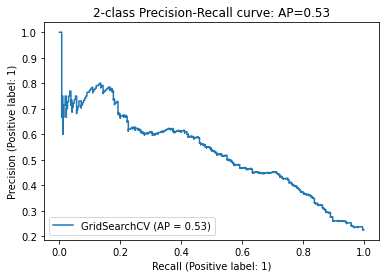

In [32]:
y_score = grid_result.decision_function(X_test[top_attributes])
average_precision = average_precision_score(y_test, y_score)
print('Average precision-recall score: {0:0.2f}'.format(average_precision))

disp = plot_precision_recall_curve(grid_result, X_test[top_attributes], y_test)
disp.ax_.set_title('2-class Precision-Recall curve: '
                   'AP={0:0.2f}'.format(average_precision))

#### View ROC curve

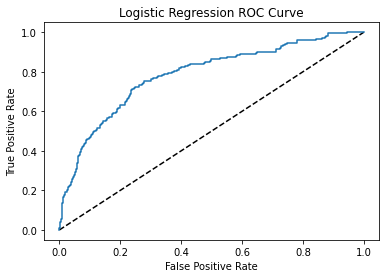

In [33]:
y_pred_prob = grid_result.predict_proba(X_test[top_attributes])
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob[:,1])
plt.plot([0,1], [0,1], 'k--')
plt.plot(fpr, tpr, label ='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve')
plt.show();

#### View raw data, predicted values, predicted probabilities
The model did end up misclassifying 49 of the 120 of those predicted to be High Quality. 46 of these were a 6-rating which is not overly concerning however 3 were a 5-rating which is a reputation risk. Filtering by probability reveals that this risk can be reduced by setting a higher probability boundary for deciding on high quality. For example, the boundary of 0.6 brings this down to 1 wine having a 5-rating out of a total 59 wines.

In [34]:
series_preds = pd.Series(data=y_pred, name='pred')
series_probs = pd.Series(data=y_pred_prob[:,1], name='pred_prob')
custom_prob = 0.6
series_preds_custom = (series_probs > custom_prob).rename(f'pred_{custom_prob}')
# print(series_preds_custom)
df_test_prob = pd.concat([X_test.reset_index(),series_preds,series_probs,series_preds_custom],axis=1)
df_test_prob.sort_values('pred_prob',ascending=False).iloc[:,:].head(50)
df_test_prob.groupby('quality').agg({'pred':['count','sum'],f'pred_{custom_prob}':['sum']}).rename(columns={'sum':'predicted True'}).sort_values('quality',ascending=False).head(10)

pred                      pred_0.6
        count predicted True predicted True
quality                                    
9           0            0.0              1
8          21            1.0             11
7          70            6.0             34
6         175           10.0             12
5         122            9.0              1
4          11            1.0              0
3           1            0.0              0

In future practice, test out XGBoost, Decision Trees and Support Vector Machine (SVM) C-Support Vector Classification (SVC).